# Alternus vera project
## Team: White walkers
## Sourabh Namillikonda 012414948

### Flow of the notebook
#### 1. Acquire the dataset (train, test) into dataframe and visualize the data
#### 2. Cross tabulation for subjects to gain insight
#### 3. Removal of null values etc. (data cleaning). Convergence of columns to get verdict column for reducing to true, false classification
#### 4. NLP data pre-processing like tokenising, stemming, lemmatization
#### 5. Get corpus frequency counts
#### 6. Apply TF-IDF Naive Bayesial classification
#### 7. Sentiment analysis and LDA
#### 8. Sensationalism classification based on mutiple factors like length, punctuation, capital letters, digits, profane words, sensational phrases
#### 9. Visualization and conclusion after applying models
#### 10. Data Enrichment using secondary data set for trained sensational classification
#### 11. Reapply models to observe improvements
#### 12. Final conclusions

In [224]:
# read data into a dataframe
import pandas as pd
import seaborn as sns; sns.set() 
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report,confusion_matrix
dfs_train = pd.read_excel("/home/sourabh/Desktop/mlclass/alternus_vera_project/datasets/liar_dataset/train.xlsx")

In [225]:
#observe a row
print("Number of Rows and Columns::", dfs_train.shape)
print(dfs_train.loc[0])

Number of Rows and Columns:: (10269, 14)
ID                                                              2635.json
label                                                               False
statement               Says the Annies List political group supports ...
subject(s)                                                       abortion
speaker                                                      dwayne-bohac
speaker's job title                                  State representative
state info                                                          Texas
party affiliation                                              republican
barely true counts                                                      0
false counts                                                            1
half true counts                                                        0
mostly true counts                                                      0
pants on fire counts                                                   

### Visualization to understand

In [226]:
#cleaning and preprocessing
X_train=dfs_train["subject(s)"]
Y_train=dfs_train["label"]

In [227]:
#simple metrics to understand these 2 columns
#cross tabulation
ct=pd.crosstab(X_train,Y_train,margins=True)
ct

label,False,True,barely-true,half-true,mostly-true,pants-fire,All
subject(s),,,,,,,
Alcohol,1,2,0,0,1,0,4
"Alcohol,animals,children,crime",0,1,0,0,0,0,1
"Alcohol,campaign-finance,ethics,public-service",0,0,0,0,1,0,1
"Alcohol,candidates-biography",0,1,0,0,0,0,1
"Alcohol,candidates-biography,crime",0,0,1,0,0,0,1
"Alcohol,children",0,0,0,0,1,0,1
"Alcohol,children,crime,public-health,public-safety",1,0,0,0,0,0,1
"Alcohol,children,drugs,marijuana",1,0,0,0,0,0,1
"Alcohol,city-government",0,0,0,0,1,0,1


In [228]:
#sorted the outputs to get more meaningful information
ct.sort_values('All', ascending=False)

label,False,True,barely-true,half-true,mostly-true,pants-fire,All
subject(s),,,,,,,
All,1995,1682,1656,2123,1965,842,10263
health-care,95,56,65,77,51,37,381
taxes,53,53,50,68,63,21,308
immigration,53,22,42,58,53,25,253
elections,52,58,32,36,44,30,252
education,34,45,34,52,64,9,238
candidates-biography,33,38,39,22,32,26,190
economy,24,33,24,30,24,3,138
guns,21,29,15,30,24,11,130


#### Thus we can observe subjectwise separation according to label. We see there are total 10263 rows and 3837 cumulative subjects which can be further separated and processed on.
#### We observe that the most talked about topics include health-care, taxes, immigration etc. So we have more information here to work with.

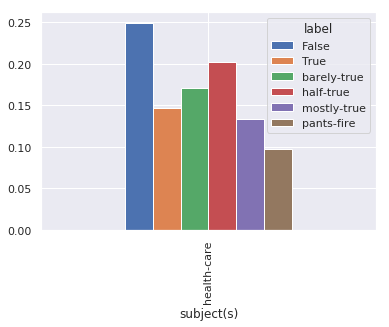

In [229]:
ct_normalized=pd.crosstab(X_train,Y_train,normalize='index', margins=True)
ct_normalized.loc[ct_normalized.index.get_level_values('subject(s)') == "health-care"].plot(kind='bar')

#### This indicates that approximately 25% in this field have False category, 20% are half-true.
#### This indicates that this issue is not extremely polarized to one category.

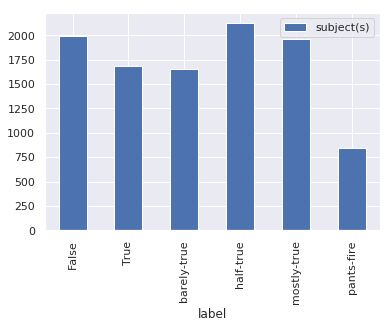

In [230]:
dfTwoCols= dfs_train[['label','subject(s)']]
dfTwoCols.groupby("label").count().plot(kind='bar')
#histograms
#import seaborn as sns
#sns.countplot(x="barely-true", data=ct_normalized,order=ct_normalized["barely-true"].value_counts().iloc[:5].index)
#plt.show()

#### For making a clear classification we will for now combine False, barely-true, pants-fire as lie and half-true, mostly-true and True as truth in separate column verdict

In [231]:
dfTwoCols['verdict'] = dfTwoCols['label'].map({False: 0, True: 1, 'barely-true':0, 'half-true':1,'mostly-true':1,'pants-fire':0})
dfTwoCols

/home/sourabh/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,label,subject(s),verdict
0,False,abortion,0
1,half-true,"energy,history,job-accomplishments",1
2,mostly-true,foreign-policy,1
3,False,health-care,0
4,half-true,"economy,jobs",1
5,True,education,1
6,barely-true,candidates-biography,0
7,half-true,ethics,1
8,half-true,jobs,1
9,mostly-true,"energy,message-machine-2014,voting-record",1


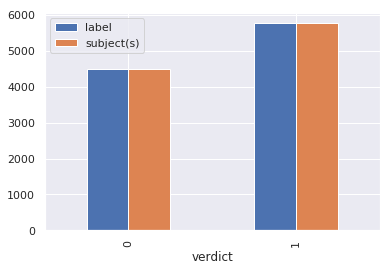

In [232]:
dfTwoCols.groupby("verdict").count().plot(kind='bar')

#### Its a good sign that we have more truthy values when compared to false information.

In [233]:
ct1=pd.crosstab(dfTwoCols["subject(s)"],dfTwoCols["verdict"],margins=True)
ct1.sort_values('All', ascending=False)

verdict,0,1,All
subject(s),,,
All,4493,5770,10263
health-care,197,184,381
taxes,124,184,308
immigration,120,133,253
elections,114,138,252
education,77,161,238
candidates-biography,98,92,190
economy,51,87,138
guns,47,83,130


#### Here we can see especially in the exceptional case of candidates-biography, social security that there is more false news than true.

### Now that we have some information we can proceed find more information by processing the text to find unique values in subjects. Also by visualization we can observe that sensational news will have extremely polarised graphs.

### Applying data preprocessing for NLP processing like tokeninsing, stemming etc

In [234]:
# original dataset
dfs_train

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN
5,12465.json,True,The Chicago Bears have had more starting quart...,education,robin-vos,Wisconsin Assembly speaker,Wisconsin,republican,0.0,3.0,2.0,5.0,1.0,a an online opinion-piece
6,2342.json,barely-true,Jim Dunnam has not lived in the district he re...,candidates-biography,republican-party-texas,NaN,Texas,republican,3.0,1.0,1.0,3.0,1.0,a press release.
7,153.json,half-true,I'm the only person on this stage who has work...,ethics,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,"a Democratic debate in Philadelphia, Pa."
8,5602.json,half-true,"However, it took $19.5 million in Oregon Lotte...",jobs,oregon-lottery,NaN,NaN,organization,0.0,0.0,1.0,0.0,1.0,a website
9,9741.json,mostly-true,Says GOP primary opponents Glenn Grothman and ...,"energy,message-machine-2014,voting-record",duey-stroebel,State representative,Wisconsin,republican,0.0,0.0,0.0,1.0,0.0,an online video


In [235]:
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(2018)
import nltk
nltk.download('wordnet')
# reference https://towardsdatascience.com/topic-modeling-and-latent-dirichlet-allocation-in-python-9bf156893c24

[nltk_data] Downloading package wordnet to /home/sourabh/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [236]:
# testing lemmatizer
print(WordNetLemmatizer().lemmatize('went', pos='v'))

go


In [237]:
# testing stemmer

stemmer = SnowballStemmer('english')
original_words = ['caresses', 'flies', 'dies', 'mules', 'denied','died', 'agreed', 'owned', 
           'humbled', 'sized','meeting', 'stating', 'siezing', 'itemization','sensational', 
           'traditional', 'reference', 'colonizer','plotted']
singles = [stemmer.stem(plural) for plural in original_words]
pd.DataFrame(data = {'original word': original_words, 'stemmed': singles})

,original word,stemmed
0,caresses,caress
1,flies,fli
2,dies,die
3,mules,mule
4,denied,deni
5,died,die
6,agreed,agre
7,owned,own
8,humbled,humbl
9,sized,size


In [238]:
# define functions
def lemmatize_stemming(text):
        return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    sdds= gensim.utils.simple_preprocess(text)
    for token in sdds:
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [239]:
# testing on a single document
doc_sample = dfs_train[dfs_train['ID'] == '2635.json']["statement"][0]

print('original document: ')
words = []
for word in doc_sample.split(' '):
    words.append(word)
print(words)
print('\n\n tokenized and lemmatized document: ')
print(preprocess(doc_sample))

original document: 
['Says', 'the', 'Annies', 'List', 'political', 'group', 'supports', 'third-trimester', 'abortions', 'on', 'demand.']


 tokenized and lemmatized document: 
['say', 'anni', 'list', 'polit', 'group', 'support', 'trimest', 'abort', 'demand']


In [240]:
# do for all documents
processed_docs = dfs_train['statement'].map(preprocess)
processed_docs[:10]

0    [say, anni, list, polit, group, support, trime...
1    [declin, coal, start, start, natur, take, star...
2    [hillari, clinton, agre, john, mccain, vote, g...
3    [health, care, reform, legisl, like, mandat, f...
4                    [econom, turnaround, start, term]
5    [chicago, bear, start, quarterback, year, tota...
6               [dunnam, live, district, repres, year]
7    [person, stage, work, activ, year, pass, russ,...
8    [take, million, oregon, lotteri, fund, port, n...
9    [say, primari, oppon, glenn, grothman, leibham...
Name: statement, dtype: object

In [241]:
# create the dictionary
dictionary = gensim.corpora.Dictionary(processed_docs)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

5328 benedict
215 right
1482 headquart
2605 loom
4595 engin
4904 midnight
731 redempt
823 judg
135 democrat
6620 hale
1927 roosevelt


In [242]:
# remove all words that appear too many or too few times and restrict to 100000 words
dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)
print(dictionary)

Dictionary(1069 unique tokens: ['good', 'alien', 'right', 'seat', 'target']...)


In [243]:
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]
bow_corpus[10][0]

#bow_corpus_list=[]
#for b in bow_corpus:
#    bow_corpus_list.append([i[0] for i in b])
#bow_corpus_list    


(24, 2)

In [244]:
# corpus and frequency count for each document
bow_doc_4310 = bow_corpus[4310]
for i in range(len(bow_doc_4310)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4310[i][0], 
                                               dictionary[bow_doc_4310[i][0]], 
bow_doc_4310[i][1]))
print(len(bow_corpus))

Word 5 ("say") appears 1 time.
Word 24 ("vote") appears 1 time.
Word 117 ("state") appears 1 time.
Word 152 ("busi") appears 1 time.
Word 352 ("nurs") appears 1 time.
Word 535 ("small") appears 1 time.
Word 708 ("doctor") appears 1 time.
Word 906 ("put") appears 1 time.
Word 1065 ("interest") appears 1 time.
10269


### Naive baysian classifier


In [245]:
# Create a pipeline
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report,confusion_matrix

pipeline = Pipeline([
    ('bow',CountVectorizer(analyzer=preprocess)), # converts strings to integer counts
    ('tfidf',TfidfTransformer()), # converts integer counts to weighted TF-IDF scores
    ('classifier',MultinomialNB()) # train on TF-IDF vectors with Naive Bayes classifier
])

In [246]:
#print(bow_corpus)
class_train=np.array(dfTwoCols["verdict"])
print(class_train)
class_train=class_train.reshape(-1,1)
print(class_train)

pipeline.fit(dfs_train['statement'],class_train)

[0 1 1 ... 1 0 0]
[[0]
 [1]
 [1]
 ...
 [1]
 [0]
 [0]]


/home/sourabh/anaconda3/lib/python3.5/site-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Pipeline(memory=None,
     steps=[('bow', CountVectorizer(analyzer=<function preprocess at 0x7fd344882620>,
        binary=False, decode_error='strict', dtype=<class 'numpy.int64'>,
        encoding='utf-8', input='content', lowercase=True, max_df=1.0,
        max_features=None, min_df=1, ngram_range=(1, 1), preprocessor=None...f=False, use_idf=True)), ('classifier', MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))])

In [247]:
# test change and assign classification on dataset
dfs_test = pd.read_excel("/home/sourabh/Desktop/mlclass/alternus_vera_project/datasets/liar_dataset/test.xlsx")
msg_test=dfs_test["statement"]
dfTwoCols_test= dfs_test[['label','subject(s)']]
dfTwoCols_test['verdict'] = dfTwoCols_test['label'].map({False: 0, True: 1, 'barely-true':0, 'half-true':1,'mostly-true':1,'pants-fire':0})
dfTwoCols_test
class_test=np.array(dfTwoCols_test["verdict"])
print(class_test)
class_test=class_test.reshape(-1,1)
print(class_test)
predictions = pipeline.predict(msg_test)

/home/sourabh/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


[1 0 0 ... 0 0 0]
[[1]
 [0]
 [0]
 ...
 [0]
 [0]
 [0]]


In [248]:
print(classification_report(class_test,predictions))

              precision    recall  f1-score   support

           0       0.61      0.30      0.40       556
           1       0.61      0.85      0.71       727

   micro avg       0.61      0.61      0.61      1283
   macro avg       0.61      0.58      0.56      1283
weighted avg       0.61      0.61      0.58      1283



#### Here we see about a 60% precision

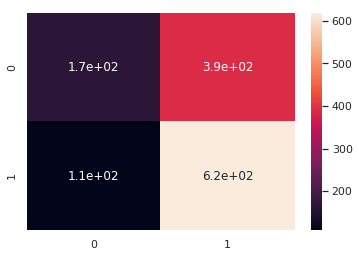

In [249]:

sns.heatmap(confusion_matrix(class_test,predictions),annot=True)
# references: https://www.kaggle.com/astandrik/simple-spam-filter-using-naive-bayes

## sentiment analysis data enrichment
https://blog.lftechnology.com/predicting-sentiment-on-news-data-45c5c22ec2e3

In [28]:
# here is a second dataset we found that can be used for enrichment
data_sentiment = pd.read_excel('/home/sourabh/Desktop/mlclass/alternus_vera_project/datasets/news-aggregator-dataset/uci-news-aggregator.xlsx')



In [29]:
data_sentiment

,ID,TITLE,URL,PUBLISHER,CATEGORY,STORY,HOSTNAME,TIMESTAMP
0,1,"Fed official says weak data caused by weather,...",http://www.latimes.com/business/money/la-fi-mo...,Los Angeles Times,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.latimes.com,1394470370698
1,2,Fed's Charles Plosser sees high bar for change...,http://www.livemint.com/Politics/H2EvwJSK2VE6O...,Livemint,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.livemint.com,1394470371207
2,3,US open: Stocks fall after Fed official hints ...,http://www.ifamagazine.com/news/us-open-stocks...,IFA Magazine,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.ifamagazine.com,1394470371550
3,4,"Fed risks falling 'behind the curve', Charles ...",http://www.ifamagazine.com/news/fed-risks-fall...,IFA Magazine,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.ifamagazine.com,1394470371793
4,5,Fed's Plosser: Nasty Weather Has Curbed Job Gr...,http://www.moneynews.com/Economy/federal-reser...,Moneynews,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.moneynews.com,1394470372027
5,6,Plosser: Fed May Have to Accelerate Tapering Pace,http://www.nasdaq.com/article/plosser-fed-may-...,NASDAQ,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.nasdaq.com,1394470372212
6,7,Fed's Plosser: Taper pace may be too slow,http://www.marketwatch.com/story/feds-plosser-...,MarketWatch,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.marketwatch.com,1394470372405
7,8,Fed's Plosser expects US unemployment to fall ...,http://www.fxstreet.com/news/forex-news/articl...,FXstreet.com,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,www.fxstreet.com,1394470372615
8,9,US jobs growth last month hit by weather:Fed P...,http://economictimes.indiatimes.com/news/inter...,Economic Times,b,ddUyU0VZz0BRneMioxUPQVP6sIxvM,economictimes.indiatimes.com,1394470372792
9,10,ECB unlikely to end sterilisation of SMP purch...,http://www.iii.co.uk/news-opinion/reuters/news...,Interactive Investor,b,dPhGU51DcrolUIMxbRm0InaHGA2XM,www.iii.co.uk,1394470501265


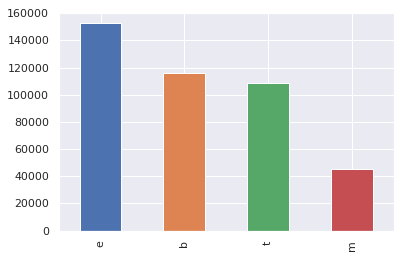

In [30]:
# print the topics being addressed here
data_sentiment['CATEGORY'].value_counts().plot(kind="bar")
plt.show()

# train/test data split
from sklearn.model_selection import train_test_split
train, test = train_test_split(data_sentiment, test_size=0.2)

### Sentiment analysis

In [31]:
# Using vader lexicon to determine sentiment
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/sourabh/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [32]:
def nltk_sentiment(sentence):
    from nltk.sentiment.vader import SentimentIntensityAnalyzer
    
    nltk_sentiment = SentimentIntensityAnalyzer()
    score = nltk_sentiment.polarity_scores(sentence)
    return score

In [33]:
nltk_results = [nltk_sentiment(row) for row in dfs_train["statement"]]
results_df = pd.DataFrame(nltk_results)
text_df = pd.DataFrame(dfs_train, columns = ['statement'])
nltk_df = text_df.join(results_df)
verdict_df=pd.DataFrame(dfTwoCols, columns=['verdict'])
nltk_df=nltk_df.join(verdict_df)

/home/sourabh/anaconda3/lib/python3.5/site-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


In [34]:
nltk_df

,statement,compound,neg,neu,pos,verdict
0,Says the Annies List political group supports ...,0.2500,0.115,0.692,0.192,0
1,When did the decline of coal start? It started...,0.3612,0.000,0.902,0.098,1
2,"Hillary Clinton agrees with John McCain ""by vo...",0.3182,0.107,0.687,0.206,1
3,Health care reform legislation is likely to ma...,0.7579,0.000,0.606,0.394,0
4,The economic turnaround started at the end of ...,0.0000,0.000,1.000,0.000,1
5,The Chicago Bears have had more starting quart...,-0.5106,0.120,0.836,0.043,1
6,Jim Dunnam has not lived in the district he re...,0.0000,0.000,1.000,0.000,0
7,I'm the only person on this stage who has work...,0.2500,0.045,0.874,0.080,1
8,"However, it took $19.5 million in Oregon Lotte...",0.0000,0.000,1.000,0.000,1
9,Says GOP primary opponents Glenn Grothman and ...,0.0000,0.000,1.000,0.000,1


In [35]:
# recassify results to get better understanding
nltk_df.loc[nltk_df['compound'] > 0.2, 'compound'] = 1
nltk_df.loc[nltk_df['compound'] < -0.2, 'compound'] = -1
nltk_df.loc[(nltk_df['compound'] > -0.2) & (nltk_df['compound'] < 0.2), 'compound'] = 0
nltk_df


,statement,compound,neg,neu,pos,verdict
0,Says the Annies List political group supports ...,1.0,0.115,0.692,0.192,0
1,When did the decline of coal start? It started...,1.0,0.000,0.902,0.098,1
2,"Hillary Clinton agrees with John McCain ""by vo...",1.0,0.107,0.687,0.206,1
3,Health care reform legislation is likely to ma...,1.0,0.000,0.606,0.394,0
4,The economic turnaround started at the end of ...,0.0,0.000,1.000,0.000,1
5,The Chicago Bears have had more starting quart...,-1.0,0.120,0.836,0.043,1
6,Jim Dunnam has not lived in the district he re...,0.0,0.000,1.000,0.000,0
7,I'm the only person on this stage who has work...,1.0,0.045,0.874,0.080,1
8,"However, it took $19.5 million in Oregon Lotte...",0.0,0.000,1.000,0.000,1
9,Says GOP primary opponents Glenn Grothman and ...,0.0,0.000,1.000,0.000,1


In [36]:
nltk_df_f=nltk_df[["statement","compound","verdict"]]

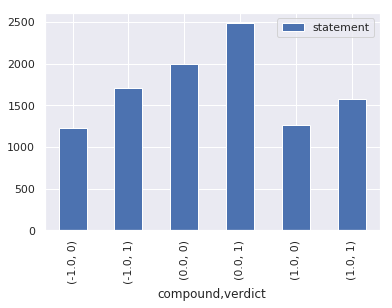

In [37]:
nltk_df_f.groupby(["compound","verdict"]).count().plot(kind='bar')

#### Here we can see the effect of negative, neuttral and positive sentiment on true and false news

## LDA

In [250]:
from gensim import corpora, models

tfidf = models.TfidfModel(bow_corpus)

In [251]:
corpus_tfidf = tfidf[bow_corpus]

In [252]:

from pprint import pprint

for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.3399028377044521),
 (1, 0.49960086945501425),
 (2, 0.40963633375026987),
 (3, 0.46333565607020666),
 (4, 0.40830190020991924),
 (5, 0.10872586224577774),
 (6, 0.27175617970851096)]


In [253]:
#lda bag of words 
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)

In [254]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.045*"say" + 0.021*"american" + 0.020*"state" + 0.019*"texa" + 0.015*"vote" + 0.014*"time" + 0.012*"million" + 0.010*"percent" + 0.008*"america" + 0.008*"nation"
Topic: 1 
Words: 0.038*"state" + 0.037*"year" + 0.030*"health" + 0.021*"care" + 0.018*"percent" + 0.015*"say" + 0.013*"wisconsin" + 0.012*"budget" + 0.011*"insur" + 0.010*"billion"
Topic: 2 
Words: 0.029*"say" + 0.028*"state" + 0.022*"percent" + 0.021*"republican" + 0.018*"vote" + 0.016*"spend" + 0.014*"senat" + 0.013*"democrat" + 0.013*"elect" + 0.011*"time"
Topic: 3 
Words: 0.041*"percent" + 0.037*"job" + 0.024*"say" + 0.023*"govern" + 0.021*"american" + 0.020*"feder" + 0.015*"creat" + 0.014*"lose" + 0.011*"incom" + 0.011*"state"
Topic: 4 
Words: 0.055*"say" + 0.019*"clinton" + 0.019*"school" + 0.017*"state" + 0.015*"hillari" + 0.014*"public" + 0.013*"tax" + 0.012*"want" + 0.012*"obama" + 0.011*"romney"
Topic: 5 
Words: 0.036*"care" + 0.035*"health" + 0.028*"say" + 0.017*"cost" + 0.016*"year" + 0.016*"plan"

From the above result we can distinguish different topics using words in each topic and there corresponding weights


Let us  TF-IDF for running LDA

In [255]:
#lda tf-idf 
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)

In [256]:
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.015*"say" + 0.014*"clinton" + 0.013*"hillari" + 0.010*"plan" + 0.009*"american" + 0.008*"percent" + 0.008*"republican" + 0.007*"million" + 0.007*"rais" + 0.007*"immigr"
Topic: 1 Word: 0.014*"govern" + 0.010*"say" + 0.010*"state" + 0.008*"year" + 0.007*"presid" + 0.007*"obama" + 0.007*"billion" + 0.007*"senat" + 0.007*"spend" + 0.007*"budget"
Topic: 2 Word: 0.015*"say" + 0.014*"obama" + 0.012*"state" + 0.012*"presid" + 0.011*"year" + 0.011*"job" + 0.011*"barack" + 0.010*"percent" + 0.008*"cost" + 0.008*"romney"
Topic: 3 Word: 0.015*"percent" + 0.012*"say" + 0.009*"obama" + 0.008*"vote" + 0.008*"abort" + 0.008*"state" + 0.008*"year" + 0.008*"cut" + 0.007*"bush" + 0.007*"presid"
Topic: 4 Word: 0.022*"health" + 0.022*"care" + 0.014*"say" + 0.014*"spend" + 0.012*"texa" + 0.011*"year" + 0.010*"percent" + 0.010*"vote" + 0.010*"state" + 0.007*"feder"
Topic: 5 Word: 0.012*"say" + 0.012*"year" + 0.011*"tax" + 0.011*"million" + 0.010*"rais" + 0.008*"percent" + 0.008*"peopl" + 0.0

In [257]:
for index, score in sorted(lda_model[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.56199049949646	 
Topic: 0.036*"care" + 0.035*"health" + 0.028*"say" + 0.017*"cost" + 0.016*"year" + 0.016*"plan" + 0.014*"million" + 0.014*"work" + 0.014*"busi" + 0.012*"percent"

Score: 0.3579902946949005	 
Topic: 0.045*"say" + 0.021*"american" + 0.020*"state" + 0.019*"texa" + 0.015*"vote" + 0.014*"time" + 0.012*"million" + 0.010*"percent" + 0.008*"america" + 0.008*"nation"

Score: 0.010003238916397095	 
Topic: 0.038*"state" + 0.037*"year" + 0.030*"health" + 0.021*"care" + 0.018*"percent" + 0.015*"say" + 0.013*"wisconsin" + 0.012*"budget" + 0.011*"insur" + 0.010*"billion"

Score: 0.010002752766013145	 
Topic: 0.055*"say" + 0.019*"clinton" + 0.019*"school" + 0.017*"state" + 0.015*"hillari" + 0.014*"public" + 0.013*"tax" + 0.012*"want" + 0.012*"obama" + 0.011*"romney"

Score: 0.0100026810541749	 
Topic: 0.057*"say" + 0.042*"obama" + 0.028*"presid" + 0.026*"barack" + 0.021*"vote" + 0.014*"percent" + 0.012*"democrat" + 0.010*"go" + 0.010*"republican" + 0.009*"support"

Score: 0.

In [258]:
for index, score in sorted(lda_model_tfidf[bow_corpus[4310]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tfidf.print_topic(index, 10)))


Score: 0.5771771669387817	 
Topic: 0.012*"year" + 0.011*"say" + 0.008*"state" + 0.008*"percent" + 0.008*"obama" + 0.007*"go" + 0.007*"million" + 0.007*"children" + 0.006*"vote" + 0.006*"dollar"

Score: 0.3428043723106384	 
Topic: 0.022*"health" + 0.022*"care" + 0.014*"say" + 0.014*"spend" + 0.012*"texa" + 0.011*"year" + 0.010*"percent" + 0.010*"vote" + 0.010*"state" + 0.007*"feder"

Score: 0.010003107599914074	 
Topic: 0.015*"percent" + 0.012*"say" + 0.009*"obama" + 0.008*"vote" + 0.008*"abort" + 0.008*"state" + 0.008*"year" + 0.008*"cut" + 0.007*"bush" + 0.007*"presid"

Score: 0.010003035888075829	 
Topic: 0.015*"state" + 0.012*"percent" + 0.011*"tax" + 0.011*"say" + 0.008*"countri" + 0.008*"vote" + 0.008*"rais" + 0.008*"job" + 0.008*"year" + 0.007*"citi"

Score: 0.010002752766013145	 
Topic: 0.015*"say" + 0.014*"obama" + 0.012*"state" + 0.012*"presid" + 0.011*"year" + 0.011*"job" + 0.011*"barack" + 0.010*"percent" + 0.008*"cost" + 0.008*"romney"

Score: 0.010002396069467068	 
Topic:

From the above result we can evaluate result by classifying sample documents using LDA bag of words model.


In [259]:
unseen_document = 'Even after Obamacare is fully implemented, there still will be tens of millions of people not covered.'
bow_vector = dictionary.doc2bow(preprocess(unseen_document))
for index, score in sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1]):
    print("Score: {}\t Topic: {}".format(score, lda_model.print_topic(index, 5)))

Score: 0.8874373435974121	 Topic: 0.038*"state" + 0.037*"year" + 0.030*"health" + 0.021*"care" + 0.018*"percent"
Score: 0.012510186061263084	 Topic: 0.045*"year" + 0.024*"obama" + 0.022*"presid" + 0.020*"say" + 0.019*"state"
Score: 0.01250997744500637	 Topic: 0.036*"care" + 0.035*"health" + 0.028*"say" + 0.017*"cost" + 0.016*"year"
Score: 0.012508220039308071	 Topic: 0.048*"say" + 0.019*"percent" + 0.018*"vote" + 0.017*"immigr" + 0.016*"peopl"
Score: 0.012507304549217224	 Topic: 0.045*"say" + 0.021*"american" + 0.020*"state" + 0.019*"texa" + 0.015*"vote"
Score: 0.012506874278187752	 Topic: 0.041*"percent" + 0.037*"job" + 0.024*"say" + 0.023*"govern" + 0.021*"american"
Score: 0.01250617578625679	 Topic: 0.046*"say" + 0.037*"state" + 0.024*"percent" + 0.018*"unit" + 0.017*"year"
Score: 0.01250569149851799	 Topic: 0.029*"say" + 0.028*"state" + 0.022*"percent" + 0.021*"republican" + 0.018*"vote"
Score: 0.012505333870649338	 Topic: 0.055*"say" + 0.019*"clinton" + 0.019*"school" + 0.017*"sta

https://dl.acm.org/citation.cfm?id=1451991

So we can see that this document is 88% related to this topic with the following important words
year,percent,vote,say etc

## Sensationalism quantification
### Based on Punctuation, Length, Similarity to Sensationalism dictionary

In [260]:
dfs_train_sensa= dfs_train
dfs_train_sensa['verdict']=dfTwoCols['verdict']
dfs_train_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context,verdict
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,0.0,0.0,0.0,a mailer,0
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,1.0,1.0,0.0,a floor speech.,1
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,Denver,1
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,3.0,5.0,44.0,a news release,0
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,20.0,19.0,2.0,an interview on CNN,1
5,12465.json,True,The Chicago Bears have had more starting quart...,education,robin-vos,Wisconsin Assembly speaker,Wisconsin,republican,0.0,3.0,2.0,5.0,1.0,a an online opinion-piece,1
6,2342.json,barely-true,Jim Dunnam has not lived in the district he re...,candidates-biography,republican-party-texas,NaN,Texas,republican,3.0,1.0,1.0,3.0,1.0,a press release.,0
7,153.json,half-true,I'm the only person on this stage who has work...,ethics,barack-obama,President,Illinois,democrat,70.0,71.0,160.0,163.0,9.0,"a Democratic debate in Philadelphia, Pa.",1
8,5602.json,half-true,"However, it took $19.5 million in Oregon Lotte...",jobs,oregon-lottery,NaN,NaN,organization,0.0,0.0,1.0,0.0,1.0,a website,1
9,9741.json,mostly-true,Says GOP primary opponents Glenn Grothman and ...,"energy,message-machine-2014,voting-record",duey-stroebel,State representative,Wisconsin,republican,0.0,0.0,0.0,1.0,0.0,an online video,1


In [261]:
#profanity list
PROFANITY=['anus', 'arse', 'arsehole', 'ass', 'ass-hat', 'ass-jabber', 'ass-pirate', 'assbag', 'assbandit', 'assbanger', 'assbite', 'assclown', 'asscock', 'asscracker', 'asses', 'assface', 'assfuck', 'assfucker', 'assgoblin', 'asshat', 'asshead', 'asshole', 'asshopper', 'assjacker', 'asslick', 'asslicker', 'assmonkey', 'assmunch', 'assmuncher', 'assnigger', 'asspirate', 'assshit', 'assshole', 'asssucker', 'asswad', 'asswipe', 'balls', 'bampot', 'bastard', 'beaner', 'bint', 'bitch', 'bitchass', 'bitches', 'bitchtits', 'bitchy', 'bloody', 'blowjob', 'blowjob', 'bollocks', 'bollox', 'boner', 'brotherfucker', 'bugger', 'bullshit', 'bumblefuck', 'butt plug', 'butt-pirate', 'buttfucka', 'buttfucker', 'camel toe', 'carpetmuncher', 'chinc', 'chink', 'choad', 'chode', 'clit', 'clitface', 'clitfuck', 'clusterfuck', 'cock', 'cockass', 'cockbite', 'cockburger', 'cockface', 'cockfucker', 'cockhead', 'cockjockey', 'cockknoker', 'cockmaster', 'cockmongler', 'cockmongruel', 'cockmonkey', 'cockmuncher', 'cocknose', 'cocknugget', 'cockshit', 'cocksmith', 'cocksmoke', 'cocksmoker', 'cocksniffer', 'cocksucker', 'cockwaffle', 'coochie', 'coochy', 'coon', 'cooter', 'cracker', 'cum', 'cumbubble', 'cumdumpster', 'cumguzzler', 'cumjockey', 'cumslut', 'cumtart', 'cunnie', 'cunnilingus', 'cunt', 'cuntass', 'cuntface', 'cunthole', 'cuntlicker', 'cuntrag', 'cuntslut', 'dago', 'damn', 'deggo', 'dick', 'dickbag', 'dickbeaters', 'dickface', 'dickfuck', 'dickfucker', 'dickhead', 'dickhole', 'dickjuice', 'dickmilk', 'dickmonger', 'dicks', 'dickslap', 'dicksucker', 'dicksucking', 'dickwad', 'dickweasel', 'dickweed', 'dickwod', 'dike', 'dildo', 'dipshit', 'doochbag', 'dookie', 'douche', 'douche-fag', 'douchebag', 'douchewaffle', 'dumass', 'dumb ass', 'dumbass', 'dumbfuck', 'dumbshit', 'dumshit', 'dyke', 'fag', 'fagbag', 'fagfucker', 'faggit', 'faggot', 'faggotcock', 'fagtard', 'fatass', 'fellatio', 'feltch', 'flamer', 'fool', 'frickin', 'friggin', 'f*ck', 'fuck', 'fuckass', 'fuckbag', 'fuckboy', 'fuckbrain', 'fuckbutt', 'fucked', 'fucker', 'fuckersucker', 'fuckface', 'fuckhead', 'fuckhole', 'fuckin', 'fucking', 'fucknut', 'fucknutt', 'fuckoff', 'fucks', 'fuckstick', 'fucktard', 'fucktart', 'fuckup', 'fuckwad', 'fuckwit', 'fuckwitt', 'fudgepacker', 'gay', 'gayass', 'gaybob', 'gaydo', 'gayfuck', 'gayfuckist', 'gaylord', 'gaytard', 'gaywad', 'goddamn', 'goddamnit', 'gooch', 'gook', 'gringo', 'guido', 'handjob', 'hard on', 'heeb', 'helminth', 'hell', 'ho', 'hoe', 'hoebag', 'homo', 'homodumbshit', 'honkey', 'humping', 'idiot', 'imbecile', 'jackass', 'jap', 'jerk off', 'jerk wad', 'jigaboo', 'jizz', 'jungle bunny', 'junglebunny', 'kike', 'kooch', 'kootch', 'kraut', 'kunt', 'kyke', 'lameass', 'lesbian', 'lesbo', 'lezzie', 'mcfagget', 'mick', 'midget', 'minge', 'moron', 'mothafucka', 'mothafuckin', 'motherfucker', 'motherfucking', 'muff', 'muffdiver', 'munging', 'negro', 'nigaboo', 'nigga', 'nigger', 'niggers', 'niglet', 'nutter', 'nut sack', 'nutsack', 'paki', 'panooch', 'pecker', 'peckerhead', 'penis', 'penisbanger', 'penisfucker', 'penispuffer', 'piss', 'pissed', 'pissed off', 'pissflaps', 'polesmoker', 'pollock', 'poon', 'poonani', 'poonany', 'poontang', 'porch monkey', 'porchmonkey', 'prick', 'punanny', 'punta', 'pussies', 'pussy', 'pussylicking', 'puto', 'queef', 'queer', 'queerbait', 'queerhole', 'renob', 'retard', 'rimjob', 'ruski', 'sand nigger', 'sandnigger', 'schlong', 'schmuck', 'scrote', 'scullion', 'shag', 'shit', 'shitass', 'shitbag', 'shitbagger', 'shitbrains', 'shitbreath', 'shitcanned', 'shitcunt', 'shitdick', 'shitface', 'shitfaced', 'shithead', 'shithole', 'shithouse', 'shitspitter', 'shitstain', 'shitter', 'shittiest', 'shitting', 'shitty', 'shiz', 'shiznit', 'skank', 'skeet', 'skullfuck', 'slag', 'slapper', 'slut', 'slutbag', 'slubberdegullion', 'smeg', 'snatch', 'sodding', 'sonofabitch', 'spastic', 'spic', 'spick', 'splooge', 'spook', 'suckass', 'tard', 'testicle', 'thundercunt', 'tit', 'titfuck', 'tits', 'tittyfuck', 'trollop', 'twat', 'twatlips', 'twats', 'twatwaffle', 'unclefucker', 'va-j-j', 'vag', 'vagina', 'vajayjay', 'vjayjay', 'wank', 'wanker', 'wankjob', 'wetback', 'whore', 'whorebag', 'whoreface', 'wop']

In [262]:
sensationalist_phrases = [

	# From Analyst's Desktop Binder of Homeland Security https://www.scribd.com/doc/82701103/Analyst-Desktop-Binder-REDACTED
	
	'Assassination',
	'Attack',
	'Domestic security',
	'Law enforcement',
	'Disaster',
	'National preparedness',
	'Response',
	'Recovery',
	'Emergency response',
	'First responder',
	'Militia',
	'Shooting',
	'Evacuation',
	'Hostage',
	'Explosion',
	'Organized crime',
	'Gangs',
	'National security',
	'State of emergency',
	'Security breach',
	'Threat',
	'Standoff',
	'Lockdown',
	'Bomb',
	'Riot',
	'Emergency Landing',
	'Incident',
	'Suspicious',
	'Nuclear threat',
	'Hazardous',
	'Infection',
	'Outbreak',
	'Contamination',
	'Terror',
	'Epidemic',
	'Critical Infrastructure',
	'National infrastructure',
	'Transportation security',
	'Grid',
	'Outage',
	'Disruption',
	'Violence',
	'Drug cartel',
	'Narcotics',
	'Shootout',
	'Trafficking',
	'Kidnap',
	'Illegal',
	'Smuggling', 
	'Al Qaeda',
	'Terror attack',
	'Weapon',
	'Improvised explosive device',
	'Suicide bomber',
	'Suicide attack',
	'Hurricane',
	'Tornado',
	'Tsunami',
	'Earthquake',
	'Tremor',
	'Flood',
	'Storm',
	'Extreme weather',
	'Forest fire',
	'Ice',
	'Stranded',
	'Wildfire',
	'Avalanche',
	'Blizzard',
	'Lightening',
	'Emergency Broadcast System',
	'Cyber Security',
	'DDOS',
	'Denial of service',
	'Malware',
	'Phishing',
	'Cyber attack',
	'Cyber terror'
]

In [263]:
def sensphrasedetect(str):
    sum =0
    for x in sensationalist_phrases:
        if x.lower() in str.lower():
            sum+=1
    return sum

In [264]:
## extract punctuation, capital letters, digits, length
import string
count = lambda l1,l2: sum([1 for x in l1 if x in l2])
#s = 'abcd!!?)().'

#print(count(s,set(string.punctuation))                                                                                                      )
#print("Capital Letters: ", sum(1 for c in "ahbcdsSJDH" if c.isupper()))
#print("Capital Letters: ", sum(1 for c in "ahbcdsSJDs2H" if c.isdigit()))
pcCount=[]
capCount=[]
digCount=[]
lenCount=[]
profanCount=[]
sensphrCount=[]
for x in dfs_train_sensa['statement']:
    pcCount.append(sum(1 for c in x if c=="!" or c=="?"))
    capCount.append(sum(1 for c in x if c.isupper()))
    digCount.append(sum(1 for c in x if c.isdigit()))
    lenCount.append(len(x))
    sensphrCount.append(sensphrasedetect(x))
for x in processed_docs:
    try:
        profanCount.append(float(len([w for w in x if w.lower() in PROFANITY]))/len(x))
    except:
        profanCount.append(0)
dfs_train_sensa['puncCount']=pcCount
dfs_train_sensa['capCount']=capCount
dfs_train_sensa['digCount']=digCount
dfs_train_sensa['lenCount']=lenCount
dfs_train_sensa['profanCount']=profanCount
dfs_train_sensa['sensPhrCount']=sensphrCount
dfs_train_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,...,mostly true counts,pants on fire counts,context,verdict,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,...,0.0,0.0,a mailer,0,0,3,0,82,0.0,0
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,...,1.0,0.0,a floor speech.,1,1,6,0,141,0.0,0
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,...,163.0,9.0,Denver,1,0,8,0,105,0.0,0
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,...,5.0,44.0,a news release,0,0,1,0,78,0.0,0
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,...,19.0,2.0,an interview on CNN,1,0,1,0,54,0.0,0
5,12465.json,True,The Chicago Bears have had more starting quart...,education,robin-vos,Wisconsin Assembly speaker,Wisconsin,republican,0.0,3.0,...,5.0,1.0,a an online opinion-piece,1,0,5,2,155,0.0,0
6,2342.json,barely-true,Jim Dunnam has not lived in the district he re...,candidates-biography,republican-party-texas,NaN,Texas,republican,3.0,1.0,...,3.0,1.0,a press release.,0,0,2,0,69,0.0,0
7,153.json,half-true,I'm the only person on this stage who has work...,ethics,barack-obama,President,Illinois,democrat,70.0,71.0,...,163.0,9.0,"a Democratic debate in Philadelphia, Pa.",1,0,4,0,159,0.0,0
8,5602.json,half-true,"However, it took $19.5 million in Oregon Lotte...",jobs,oregon-lottery,NaN,NaN,organization,0.0,0.0,...,0.0,1.0,a website,1,0,13,3,144,0.0,0
9,9741.json,mostly-true,Says GOP primary opponents Glenn Grothman and ...,"energy,message-machine-2014,voting-record",duey-stroebel,State representative,Wisconsin,republican,0.0,0.0,...,1.0,0.0,an online video,1,0,8,3,132,0.0,0


In [265]:
#print values
dfs_train_sensa_true=dfs_train_sensa[dfs_train_sensa['verdict']==1]
dfs_train_sensa_false=dfs_train_sensa[dfs_train_sensa['verdict']==0]
print("true: "+str(dfs_train_sensa_true.shape[0]))
print("avg punc: "+str(dfs_train_sensa_true["puncCount"].mean()))
print("avg cap: "+str(dfs_train_sensa_true["capCount"].mean()))
print("avg dig: "+str(dfs_train_sensa_true["digCount"].mean()))
print("avg len: "+str(dfs_train_sensa_true["lenCount"].mean()))
print("avg profan: "+str(dfs_train_sensa_true["profanCount"].mean()))
print("avg sensation phr: "+str(dfs_train_sensa_true["sensPhrCount"].mean()))
print("false: "+str(dfs_train_sensa_false.shape[0]))
print("avg punc: "+str(dfs_train_sensa_false["puncCount"].mean()))
print("avg cap: "+str(dfs_train_sensa_false["capCount"].mean()))
print("avg dig: "+str(dfs_train_sensa_false["digCount"].mean()))
print("avg len: "+str(dfs_train_sensa_false["lenCount"].mean()))
print("avg profan: "+str(dfs_train_sensa_false["profanCount"].mean()))
print("avg sensation phr: "+str(dfs_train_sensa_false["sensPhrCount"].mean()))

true: 5772
avg punc: 0.011607761607761608
avg cap: 3.4604989604989607
avg dig: 1.8284823284823284
avg len: 108.27494802494803
avg profan: 0.0002846490827260058
avg sensation phr: 0.12872487872487873
false: 4497
avg punc: 0.01801200800533689
avg cap: 3.806315321325328
avg dig: 1.2995330220146764
avg len: 103.69090504780965
avg profan: 0.00043471988935631366
avg sensation phr: 0.1472092506115188


### Thus we can conclusively confirm that on an average true stories have lower punctuations like (!,?), lower profanity. lower sensational phrases and lower number of capital letters.
### On the other hand they are more specific with digits and are longer than fake news.

In [266]:
dfs_test_sensa=dfs_test
dfs_test_sensa['verdict']=dfTwoCols_test['verdict']
dfs_test_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,half true counts,mostly true counts,pants on fire counts,context,verdict
0,11972.json,True,Building a wall on the U.S.-Mexico border will...,immigration,rick-perry,Governor,Texas,republican,30.0,30.0,42.0,23.0,18.0,Radio interview,1
1,11685.json,False,Wisconsin is on pace to double the number of l...,jobs,katrina-shankland,State representative,Wisconsin,democrat,2.0,1.0,0.0,0.0,0.0,a news conference,0
2,11096.json,False,Says John McCain has done nothing to help the ...,"military,veterans,voting-record",donald-trump,President-Elect,New York,republican,63.0,114.0,51.0,37.0,61.0,comments on ABC's This Week.,0
3,5209.json,half-true,Suzanne Bonamici supports a plan that will cut...,"medicare,message-machine-2012,campaign-adverti...",rob-cornilles,consultant,Oregon,republican,1.0,1.0,3.0,1.0,1.0,a radio show,1
4,9524.json,pants-fire,When asked by a reporter whether hes at the ce...,"campaign-finance,legal-issues,campaign-adverti...",state-democratic-party-wisconsin,NaN,Wisconsin,democrat,5.0,7.0,2.0,2.0,7.0,a web video,0
5,5962.json,True,Over the past five years the federal governmen...,"federal-budget,pensions,retirement",brendan-doherty,NaN,Rhode Island,republican,1.0,2.0,1.0,1.0,0.0,a campaign website,1
6,7070.json,True,Says that Tennessee law requires that schools ...,"county-budget,county-government,education,taxes",stand-children-tennessee,Child and education advocacy organization.,Tennessee,none,0.0,0.0,0.0,0.0,0.0,in a post on Facebook.,1
7,1046.json,barely-true,"Says Vice President Joe Biden ""admits that the...","economy,stimulus",john-boehner,Speaker of the House of Representatives,Ohio,republican,13.0,22.0,11.0,4.0,2.0,a press release.,0
8,12849.json,True,Donald Trump is against marriage equality. He ...,"gays-and-lesbians,marriage",sean-patrick-maloney,Congressman for NY-18,New York,democrat,0.0,0.0,0.0,0.0,0.0,a speech at the Democratic National Convention,1
9,13270.json,barely-true,We know that more than half of Hillary Clinton...,foreign-policy,mike-pence,Governor,Indiana,republican,8.0,10.0,12.0,5.0,0.0,"comments on ""Meet the Press""",0


In [267]:
processed_docs_test = dfs_test['statement'].map(preprocess)
processed_docs_test[:10]

0           [build, wall, mexico, border, liter, year]
1       [wisconsin, pace, doubl, number, layoff, year]
2                       [say, john, mccain, help, vet]
3    [suzann, bonamici, support, plan, choic, medic...
4    [ask, report, center, crimin, scheme, violat, ...
5    [past, year, feder, govern, pay, million, reti...
6    [say, tennesse, requir, school, receiv, half, ...
7    [say, vice, presid, biden, admit, american, pe...
8                [donald, trump, marriag, equal, want]
9    [know, half, hillari, clinton, meet, secretari...
Name: statement, dtype: object

In [268]:
## extract punctuation, capital letters, digits, length
import string
tpcCount=[]
tcapCount=[]
tdigCount=[]
tlenCount=[]
tprofanCount=[]
tsensphrCount=[]
for x in dfs_test_sensa['statement']:
    tpcCount.append(sum(1 for c in x if c=="!" or c=="?"))
    tcapCount.append(sum(1 for c in x if c.isupper()))
    tdigCount.append(sum(1 for c in x if c.isdigit()))
    tlenCount.append(len(x))
    tsensphrCount.append(sensphrasedetect(x))
for x in processed_docs_test:
    try:
        tprofanCount.append(float(len([w for w in x if w.lower() in PROFANITY]))/len(x))
    except:
        tprofanCount.append(0)
dfs_test_sensa['puncCount']=tpcCount
dfs_test_sensa['capCount']=tcapCount
dfs_test_sensa['digCount']=tdigCount
dfs_test_sensa['lenCount']=tlenCount
dfs_test_sensa['profanCount']=tprofanCount
dfs_test_sensa['sensPhrCount']=tsensphrCount
dfs_test_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,...,mostly true counts,pants on fire counts,context,verdict,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount
0,11972.json,True,Building a wall on the U.S.-Mexico border will...,immigration,rick-perry,Governor,Texas,republican,30.0,30.0,...,23.0,18.0,Radio interview,1,0,4,0,68,0.0,0
1,11685.json,False,Wisconsin is on pace to double the number of l...,jobs,katrina-shankland,State representative,Wisconsin,democrat,2.0,1.0,...,0.0,0.0,a news conference,0,0,1,0,63,0.0,0
2,11096.json,False,Says John McCain has done nothing to help the ...,"military,veterans,voting-record",donald-trump,President-Elect,New York,republican,63.0,114.0,...,37.0,61.0,comments on ABC's This Week.,0,0,4,0,51,0.0,0
3,5209.json,half-true,Suzanne Bonamici supports a plan that will cut...,"medicare,message-machine-2012,campaign-adverti...",rob-cornilles,consultant,Oregon,republican,1.0,1.0,...,1.0,1.0,a radio show,1,0,4,0,85,0.0,1
4,9524.json,pants-fire,When asked by a reporter whether hes at the ce...,"campaign-finance,legal-issues,campaign-adverti...",state-democratic-party-wisconsin,NaN,Wisconsin,democrat,5.0,7.0,...,2.0,7.0,a web video,0,0,4,0,127,0.0,0
5,5962.json,True,Over the past five years the federal governmen...,"federal-budget,pensions,retirement",brendan-doherty,NaN,Rhode Island,republican,1.0,2.0,...,1.0,0.0,a campaign website,1,0,1,3,149,0.0,0
6,7070.json,True,Says that Tennessee law requires that schools ...,"county-budget,county-government,education,taxes",stand-children-tennessee,Child and education advocacy organization.,Tennessee,none,0.0,0.0,...,0.0,0.0,in a post on Facebook.,1,0,4,2,155,0.0,0
7,1046.json,barely-true,"Says Vice President Joe Biden ""admits that the...","economy,stimulus",john-boehner,Speaker of the House of Representatives,Ohio,republican,13.0,22.0,...,4.0,2.0,a press release.,0,0,6,0,117,0.0,1
8,12849.json,True,Donald Trump is against marriage equality. He ...,"gays-and-lesbians,marriage",sean-patrick-maloney,Congressman for NY-18,New York,democrat,0.0,0.0,...,0.0,0.0,a speech at the Democratic National Convention,1,0,3,0,63,0.0,0
9,13270.json,barely-true,We know that more than half of Hillary Clinton...,foreign-policy,mike-pence,Governor,Indiana,republican,8.0,10.0,...,5.0,0.0,"comments on ""Meet the Press""",0,0,5,0,149,0.0,0


In [269]:
dfs_test_sensa.columns[15:21]

Index(['puncCount', 'capCount', 'digCount', 'lenCount', 'profanCount',
       'sensPhrCount'],
      dtype='object')

In [270]:
x_train=dfs_train_sensa[dfs_train_sensa.columns[15:21]]
y_train=dfs_train_sensa['verdict']
x_test= dfs_test_sensa[dfs_test_sensa.columns[15:21]]
y_test = dfs_test_sensa['verdict']

Accuracy score is:
0.5253312548713952


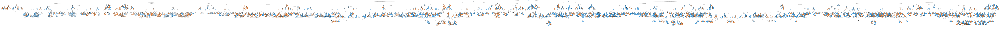

In [271]:
#Decision tree
from IPython.display import Image  
from sklearn.externals.six import StringIO
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import pydot
dot_data = StringIO()  
dtree=DecisionTreeClassifier()
features = list(dfs_train_sensa.columns[15:21])
from sklearn.metrics import accuracy_score
dtree.fit(x_train,y_train)
y_pred=dtree.predict(x_test)
print('Accuracy score is:')
print(accuracy_score(y_test,y_pred))

#we need pass features columns and dtree to graphviz 
export_graphviz(dtree,out_file=dot_data,feature_names=features,filled=True,rounded=True)
graph = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph[0].create_png()) 

In [272]:
#Naive Bayes
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
gnb = GaussianNB()
gnb.fit(x_train,y_train)
y_pred = gnb.predict(x_test)
print(classification_report(y_test,y_pred))
cnfmtx=confusion_matrix(y_test,y_pred)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, y_pred))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, y_pred))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, y_pred)))
print('Accuracy :', accuracy_score(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.58      0.06      0.11       556
           1       0.57      0.97      0.72       727

   micro avg       0.57      0.57      0.57      1283
   macro avg       0.58      0.51      0.41      1283
weighted avg       0.58      0.57      0.45      1283

Confusion matrix:
 [[ 33 523]
 [ 24 703]]
Mean squared error: 0.43
Mean absolute error: 0.43
Root Mean Squared Error: 0.65 
Accuracy : 0.573655494933749


              precision    recall  f1-score   support

           0       0.45      0.41      0.43       556
           1       0.58      0.62      0.60       727

   micro avg       0.53      0.53      0.53      1283
   macro avg       0.52      0.52      0.52      1283
weighted avg       0.53      0.53      0.53      1283

Confusion matrix:
 [[230 326]
 [276 451]]
Mean squared error: 0.47
Mean absolute error: 0.47
Root Mean Squared Error: 0.68 
Accuracy  0.5307872174590803
Variable: lenCount             Importance: 0.75
Variable: capCount             Importance: 0.11
Variable: digCount             Importance: 0.1
Variable: sensPhrCount         Importance: 0.02
Variable: puncCount            Importance: 0.01
Variable: profanCount          Importance: 0.0


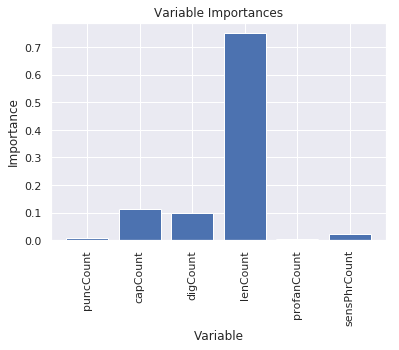

In [273]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier
from numpy.core.umath_tests import inner1d
rfc=RandomForestClassifier(n_estimators=100)
rfc.fit(x_train,y_train)
rfc_pred=rfc.predict(x_test)
print(classification_report(y_test,rfc_pred))
cnfmtx=confusion_matrix(y_test,rfc_pred)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, rfc_pred))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, rfc_pred))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, rfc_pred)))
print("Accuracy ",accuracy_score(y_test,rfc_pred))

#plot 1 tree
tree = rfc.estimators_[5]
export_graphviz(tree, out_file = 'tree.dot', feature_names = features, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
Image(graph.create_png())


#get important features
# Get numerical feature importances
importances = list(rfc.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(features, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

#plot important features
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical')
# Tick labels for x axis
plt.xticks(x_values, features, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

In [274]:
#SVM
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix
model = SVC()
model.fit(x_train,y_train)
predictions = model.predict(x_test)
print(classification_report(y_test,predictions))
cnfmtx=confusion_matrix(y_test,predictions)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, predictions))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, predictions))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, predictions)))

/home/sourabh/anaconda3/lib/python3.5/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


              precision    recall  f1-score   support

           0       0.49      0.27      0.35       556
           1       0.58      0.78      0.67       727

   micro avg       0.56      0.56      0.56      1283
   macro avg       0.54      0.53      0.51      1283
weighted avg       0.54      0.56      0.53      1283

Confusion matrix:
 [[151 405]
 [158 569]]
Mean squared error: 0.44
Mean absolute error: 0.44
Root Mean Squared Error: 0.66 


In [275]:
#multiple linear regression
from sklearn import datasets, linear_model, metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

reg = linear_model.LinearRegression() 

# Train the model using the training sets
reg.fit(x_train, y_train) 

coeff_df = pd.DataFrame(reg.coef_, x_train.columns, columns=['Coefficient'])  
print(coeff_df)  

# Make predictions using the testing set
y_pred = reg.predict(x_test)

df1 = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})  
print(df1)
print("R squared : %.2f" %r2_score(y_test, y_pred))
print("Mean squared error: %.2f" %mean_squared_error(y_test, y_pred))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, y_pred))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, y_pred)))

              Coefficient
puncCount       -0.054763
capCount        -0.017567
digCount         0.015220
lenCount         0.000760
profanCount     -0.678835
sensPhrCount    -0.037932
      Actual  Predicted
0          1   0.508078
1          0   0.556975
2          0   0.495151
3          1   0.483072
4          0   0.552941
5          1   0.668029
6          1   0.604672
7          0   0.472272
8          1   0.521842
9          0   0.552103
10         0   0.504198
11         0   0.422769
12         0   0.523441
13         0   0.652061
14         1   0.542528
15         1   0.652073
16         0   0.563741
17         1   0.592617
18         1   0.625394
19         0   0.540930
20         1   0.612484
21         1   0.488913
22         0   0.557022
23         1   0.537205
24         0   0.534692
25         1   0.563688
26         0   0.530284
27         1   0.550815
28         1   0.592559
29         1   0.557823
...      ...        ...
1253       1   0.497355
1254       0   0.546780
12

### Naive bayes gives best model for these factors

## Doc2Vec for sensationalism
https://medium.com/@mishra.thedeepak/doc2vec-simple-implementation-example-df2afbbfbad5

In [276]:
#Import all the dependencies
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize

In [277]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/sourabh/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

### Using data enrichment from second dataset to get train data for sensationalism to be added as a component to improve accuracy

In [278]:

df_Sensational = pd.read_csv("/home/sourabh/Desktop/mlclass/alternus_vera_project/datasets/sample_test_data.csv")
df_Sensational

,headline,article,source,issensational
0,VIDEO: Host Breaks Down As He Learns What Musl...,"June 27, 2017Emily AnnReligion, World News\nA ...",Madworld,1
1,Chinese city leadership shake-up signals Xi po...,Beijing – A sudden leadership change in one of...,Brief.News,0
2,Miami judge rules Florida’s new ‘Stand Your Gr...,Brandon Morse 2 hours\nA Miami-Dade judge rule...,TheBlaze,1
3,"Trump, reversing course, wants Senate Republic...",Michael Reynolds / Getty Images\nPresident Tru...,LA Times – Politics,0
4,Pro-life group alleges Twitter is suppressing ...,"Kate Scanlon Jun 27, 2017 5:36 pm\nTwitter has...",TheBlaze,1
5,"BREAKING: Jeff Sessions Breaks Silence, Indict...","Under Attorney General Jeff Sessions, the Depa...",The Truth Division,1
6,Fire department IDs unit where Honolulu high-r...,A man takes pictures off of a balcony of the d...,Miami Herald – Politics,0
7,Fourth of July fireworks cause 68 horses to cr...,July 4 (UPI) -- Dozens of horses in Kentucky w...,United Press International – US,0
8,Remind Me Never To Piss Off Sarah Sanders!,"June 23, 2017Natalie D.0 Views 0 Comments# Pre...",USA Supreme,1
9,TODAY: 3 MOST FAMOUS Black Lives Matter Activi...,"June 28, 2017 by Thomas Rhett\nA couple of lib...",Proud Leader,1


In [279]:
data = df_Sensational['article'].values.tolist()
print(type(data))
tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(df_Sensational.loc[i,'issensational'])]) for i, _d in enumerate(data)]
#tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(data)]
tagged_data

<class 'list'>


[TaggedDocument(words=['june', '27', ',', '2017emily', 'annreligion', ',', 'world', 'news', 'a', 'woman', 'named', 'dakhill', '(', 'left', ')', 'tells', 'the', 'story', 'of', 'sex', 'slaves', 'held', 'hostage', 'by', 'isis', '(', 'right', ')', '.', 'a', 'woman', 'who', 'was', 'held', 'hostage', 'by', 'isis', 'was', 'unknowingly', 'forced', 'to', 'eat', 'the', 'unthinkable', 'while', 'being', 'kept', 'in', 'a', 'cell', 'by', 'the', 'fanatics', '.', 'after', 'isis', 'had', 'starved', 'the', 'mother', 'for', 'three', 'days', ',', 'the', 'iraqi', 'men', 'served', 'her', 'what', 'she', 'thought', 'was', 'meat', 'and', 'rice', ',', 'but', 'it', 'was', 'something', 'else', 'entirely', '—', 'something', 'far', 'worse', '.', 'isis', 'held', 'a', 'yazidi', 'christian', 'mother', 'captive', 'in', 'a', 'cell', 'for', 'three', 'days', 'with', 'no', 'food', 'or', 'water', 'before', 'she', 'was', 'tricked', 'into', 'eating', 'something', 'absolutely', 'cringe-worthy', 'by', 'an', 'evil', 'guard', '.'

In [280]:
#data = ["I love machine learning. Its awesome.",
#        "I love coding in python",
#        "I love building chatbots",
#        "they chat amagingly well",
#        "I love coding in python"]
#tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(data)]
#tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[dfs_train_sensa.loc[i,'verdict']]) for i, _d in enumerate(data)]

#data = dfs_train_sensa[['statement']]

#tagged_data = [TaggedDocument(words=_d['statement'].apply(word_tokenize), tags=[dfs_train_sensa.loc[i,'verdict']]) for i, _d in enumerate([data])]

In [281]:
max_epochs = 100
vec_size = 20
alpha = 0.025

model = Doc2Vec(size=vec_size,
                alpha=alpha, 
                min_alpha=0.00025,
                min_count=1,
                dm =0)
  
model.build_vocab(tagged_data)

for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch))
    model.train(tagged_data,total_examples=model.corpus_count,epochs=model.iter)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha

model.save("d2v.model")
print("Model Saved")

/home/sourabh/anaconda3/lib/python3.5/site-packages/gensim/models/doc2vec.py:366: UserWarning: The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.
  warnings.warn("The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.")


iteration 0


/home/sourabh/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:15: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  from ipykernel import kernelapp as app


iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
iteration 66
iteration 67
iteration 68
iteration 69
iteration 70
iteration 71
iteration 72
iteration 73
iteration 74
iteration 75
iteration 76
iteration 77
iteratio

In [282]:
#testing for a document
from gensim.models.doc2vec import Doc2Vec

model= Doc2Vec.load("d2v.model")
#to find the vector of a document which is not in training data
test_data = word_tokenize('A woman named Dakhill (left) tells the story of sex slaves held hostage by ISIS (right).A woman who was held hostage by ISIS was unknowingly forced to eat the unthinkable while being kept in a cell by the fanatics. After ISIS had starved the mother for three days, the Iraqi men served her what she thought was meat and rice, but it was something else entirely — something far worse.ISIS held a Yazidi Christian mother captive in a cell for three days with no food or water before she was tricked into eating something absolutely cringe-worthy by an evil guard. When she finished her meal, the guard said, “We cooked your one-year-old son that we took from you, and this is what you just ate.”The faces behind this gruesome act of terror are devil-worshiping men who believe they are worshiping god and carry out unspeakably cruel acts against minorities in the Middle East daily. These men are taking women and children as sex slaves and massacring thousands every day. Anyone who can do something so unimaginable and follow a religion that allows it is one sick individual.The interviewer wiped away his tears, like anyone being told this horrific story would do, as his guest, identified only as Dakhill, continued with heart-wrenching stories of the captured woman in the Middle East.'.lower())
v1 = model.infer_vector(test_data)
#print("V1_infer", v1)

# to find most similar doc using tags
#similar_doc = model.docvecs.most_similar('1')
similar_doc = model.docvecs.most_similar([v1])
print(similar_doc[0][0])
#print()

# to find vector of doc in training data using tags or in other words, printing the vector of document at index 1 in training data
#print(model.docvecs['1'])
#print(model.docvecs['4'])

1


### get a dataset for sensational documents apply doc2vec on it, use liar dataset as testdata to find out if a document is sensational or not. use crosstabulation to compare sensationalism result and verdict to see how sesationalism is related to verdict


In [290]:
#computing for entire data
sensationCol=[]
for row in dfs_train_sensa['statement']:
    test_data = word_tokenize(row.lower())
    v1 = model.infer_vector(test_data)
    similar_doc = model.docvecs.most_similar([v1])
    sensationCol.append(similar_doc[0][0])
sensationCol=list(map(int, sensationCol))
sensationCol

[0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,


In [291]:
dfs_train_sensa['sensationCol']=sensationCol
dfs_train_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,...,pants on fire counts,context,verdict,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount,sensationCol
0,2635.json,False,Says the Annies List political group supports ...,abortion,dwayne-bohac,State representative,Texas,republican,0.0,1.0,...,0.0,a mailer,0,0,3,0,82,0.0,0,0
1,10540.json,half-true,When did the decline of coal start? It started...,"energy,history,job-accomplishments",scott-surovell,State delegate,Virginia,democrat,0.0,0.0,...,0.0,a floor speech.,1,1,6,0,141,0.0,0,1
2,324.json,mostly-true,"Hillary Clinton agrees with John McCain ""by vo...",foreign-policy,barack-obama,President,Illinois,democrat,70.0,71.0,...,9.0,Denver,1,0,8,0,105,0.0,0,0
3,1123.json,False,Health care reform legislation is likely to ma...,health-care,blog-posting,NaN,NaN,none,7.0,19.0,...,44.0,a news release,0,0,1,0,78,0.0,0,0
4,9028.json,half-true,The economic turnaround started at the end of ...,"economy,jobs",charlie-crist,NaN,Florida,democrat,15.0,9.0,...,2.0,an interview on CNN,1,0,1,0,54,0.0,0,1
5,12465.json,True,The Chicago Bears have had more starting quart...,education,robin-vos,Wisconsin Assembly speaker,Wisconsin,republican,0.0,3.0,...,1.0,a an online opinion-piece,1,0,5,2,155,0.0,0,0
6,2342.json,barely-true,Jim Dunnam has not lived in the district he re...,candidates-biography,republican-party-texas,NaN,Texas,republican,3.0,1.0,...,1.0,a press release.,0,0,2,0,69,0.0,0,0
7,153.json,half-true,I'm the only person on this stage who has work...,ethics,barack-obama,President,Illinois,democrat,70.0,71.0,...,9.0,"a Democratic debate in Philadelphia, Pa.",1,0,4,0,159,0.0,0,1
8,5602.json,half-true,"However, it took $19.5 million in Oregon Lotte...",jobs,oregon-lottery,NaN,NaN,organization,0.0,0.0,...,1.0,a website,1,0,13,3,144,0.0,0,0
9,9741.json,mostly-true,Says GOP primary opponents Glenn Grothman and ...,"energy,message-machine-2014,voting-record",duey-stroebel,State representative,Wisconsin,republican,0.0,0.0,...,0.0,an online video,1,0,8,3,132,0.0,0,0


In [292]:
# same for testing data
testsensationCol=[]
for row in dfs_test_sensa['statement']:
    test_data = word_tokenize(row.lower())
    v1 = model.infer_vector(test_data)
    similar_doc = model.docvecs.most_similar([v1])
    testsensationCol.append(similar_doc[0][0])
testsensationCol=list(map(int, testsensationCol))
dfs_test_sensa['sensationCol']=testsensationCol
dfs_test_sensa

,ID,label,statement,subject(s),speaker,speaker's job title,state info,party affiliation,barely true counts,false counts,...,pants on fire counts,context,verdict,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount,sensationCol
0,11972.json,True,Building a wall on the U.S.-Mexico border will...,immigration,rick-perry,Governor,Texas,republican,30.0,30.0,...,18.0,Radio interview,1,0,4,0,68,0.0,0,0
1,11685.json,False,Wisconsin is on pace to double the number of l...,jobs,katrina-shankland,State representative,Wisconsin,democrat,2.0,1.0,...,0.0,a news conference,0,0,1,0,63,0.0,0,0
2,11096.json,False,Says John McCain has done nothing to help the ...,"military,veterans,voting-record",donald-trump,President-Elect,New York,republican,63.0,114.0,...,61.0,comments on ABC's This Week.,0,0,4,0,51,0.0,0,0
3,5209.json,half-true,Suzanne Bonamici supports a plan that will cut...,"medicare,message-machine-2012,campaign-adverti...",rob-cornilles,consultant,Oregon,republican,1.0,1.0,...,1.0,a radio show,1,0,4,0,85,0.0,1,0
4,9524.json,pants-fire,When asked by a reporter whether hes at the ce...,"campaign-finance,legal-issues,campaign-adverti...",state-democratic-party-wisconsin,NaN,Wisconsin,democrat,5.0,7.0,...,7.0,a web video,0,0,4,0,127,0.0,0,1
5,5962.json,True,Over the past five years the federal governmen...,"federal-budget,pensions,retirement",brendan-doherty,NaN,Rhode Island,republican,1.0,2.0,...,0.0,a campaign website,1,0,1,3,149,0.0,0,1
6,7070.json,True,Says that Tennessee law requires that schools ...,"county-budget,county-government,education,taxes",stand-children-tennessee,Child and education advocacy organization.,Tennessee,none,0.0,0.0,...,0.0,in a post on Facebook.,1,0,4,2,155,0.0,0,0
7,1046.json,barely-true,"Says Vice President Joe Biden ""admits that the...","economy,stimulus",john-boehner,Speaker of the House of Representatives,Ohio,republican,13.0,22.0,...,2.0,a press release.,0,0,6,0,117,0.0,1,0
8,12849.json,True,Donald Trump is against marriage equality. He ...,"gays-and-lesbians,marriage",sean-patrick-maloney,Congressman for NY-18,New York,democrat,0.0,0.0,...,0.0,a speech at the Democratic National Convention,1,0,3,0,63,0.0,0,0
9,13270.json,barely-true,We know that more than half of Hillary Clinton...,foreign-policy,mike-pence,Governor,Indiana,republican,8.0,10.0,...,0.0,"comments on ""Meet the Press""",0,0,5,0,149,0.0,0,1


In [293]:
x_train=dfs_train_sensa[dfs_train_sensa.columns[15:22]]
y_train=dfs_train_sensa['verdict']
x_test= dfs_test_sensa[dfs_test_sensa.columns[15:22]]
y_test = dfs_test_sensa['verdict']

In [294]:
x_train


,puncCount,capCount,digCount,lenCount,profanCount,sensPhrCount,sensationCol
0,0,3,0,82,0.0,0,0
1,1,6,0,141,0.0,0,1
2,0,8,0,105,0.0,0,0
3,0,1,0,78,0.0,0,0
4,0,1,0,54,0.0,0,1
5,0,5,2,155,0.0,0,0
6,0,2,0,69,0.0,0,0
7,0,4,0,159,0.0,0,1
8,0,13,3,144,0.0,0,0
9,0,8,3,132,0.0,0,0


In [295]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
gnb = GaussianNB()
gnb.fit(x_train,y_train)
y_pred = gnb.predict(x_test)
print(classification_report(y_test,y_pred))
cnfmtx=confusion_matrix(y_test,y_pred)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, y_pred))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, y_pred))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, y_pred)))
print('Accuracy :', accuracy_score(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.60      0.06      0.11       556
           1       0.57      0.97      0.72       727

   micro avg       0.58      0.58      0.58      1283
   macro avg       0.59      0.51      0.41      1283
weighted avg       0.59      0.58      0.45      1283

Confusion matrix:
 [[ 32 524]
 [ 21 706]]
Mean squared error: 0.42
Mean absolute error: 0.42
Root Mean Squared Error: 0.65 
Accuracy : 0.5752143413873734


              precision    recall  f1-score   support

           0       0.45      0.39      0.42       556
           1       0.57      0.63      0.60       727

   micro avg       0.53      0.53      0.53      1283
   macro avg       0.51      0.51      0.51      1283
weighted avg       0.52      0.53      0.52      1283

Confusion matrix:
 [[218 338]
 [270 457]]
Mean squared error: 0.47
Mean absolute error: 0.47
Root Mean Squared Error: 0.69 
Accuracy  0.5261106780982073
Variable: lenCount             Importance: 0.74
Variable: capCount             Importance: 0.12
Variable: digCount             Importance: 0.1
Variable: sensPhrCount         Importance: 0.02
Variable: puncCount            Importance: 0.01
Variable: sensationCol         Importance: 0.01
Variable: profanCount          Importance: 0.0


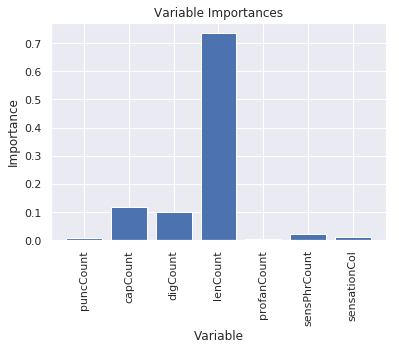

In [296]:
#Random Forest
features = list(dfs_train_sensa.columns[15:22])
from sklearn.ensemble import RandomForestClassifier
from numpy.core.umath_tests import inner1d
rfc=RandomForestClassifier(n_estimators=100)
rfc.fit(x_train,y_train)
rfc_pred=rfc.predict(x_test)
print(classification_report(y_test,rfc_pred))
cnfmtx=confusion_matrix(y_test,rfc_pred)
print("Confusion matrix:\n",cnfmtx)

print("Mean squared error: %.2f" %mean_squared_error(y_test, rfc_pred))
print("Mean absolute error: %.2f" %mean_absolute_error(y_test, rfc_pred))
print('Root Mean Squared Error: %.2f ' %np.sqrt(mean_squared_error(y_test, rfc_pred)))
print("Accuracy ",accuracy_score(y_test,rfc_pred))

#plot 1 tree
tree = rfc.estimators_[6]
export_graphviz(tree, out_file = 'tree.dot', feature_names = features, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
Image(graph.create_png())


#get important features
# Get numerical feature importances
importances = list(rfc.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(features, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

#plot important features
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical')
# Tick labels for x axis
plt.xticks(x_values, features, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

### Thus we used the second dataset along with doc2vec to get sensationalism classification. We got a little better accuracy. If we have better train data where we have sensationalism classificaition on liar dataset then results would be much better.

## Thus sensational documents have higher punctuations like (!,?), profanity, sensational phrases and number of capital letters.
## On the other hand non-sensational docs are more specific with more digits and are longer than fake news.

## Our expectation is that if we get better training data closer to the original data that we are testing we will significantly improve our results. This is indicated by the fact that even the use of unrelated data set improved the overall results although not by much.

## We understand that sensationalism alone is not enough to determine if a news is fake or not but it does play a role. We wanted to assign a 30% importance to sensationalism among the 4 factors that we are using  to classify data as true or not.

## Hence sensationalism factor = 0.3*(prediction from NB)

## Further, sensationalism may not be just linearly related to the overall equation. We can conclude that it may depend on the results of other factors like source credibility. It can be assumed that if credibility is high then sensationalism factor will compound the effect that the news is explosively true. But if credibility is low then high sensationalism will most likely be fake news.